In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning)

In [3]:
import numpy as np
from tqdm import tqdm
from pathlib import Path
import openslide
import pandas as pd

In [4]:
from fastai.callbacks.csv_logger import CSVLogger

In [5]:
from object_detection_fastai.helper.object_detection_helper import *
from object_detection_fastai.helper.wsi_loader import *
from object_detection_fastai.loss.RetinaNetFocalLoss import RetinaNetFocalLoss
from object_detection_fastai.models.RetinaNet import RetinaNet
from object_detection_fastai.callbacks.callbacks import BBLossMetrics, BBMetrics, PascalVOCMetric, PascalVOCMetricByDistance

In [6]:
slides_train = list(set(['BAL_Cat_Turnbull blue_1.svs', 
                              'BAL_Cat_Turnbull blue_2.svs', 
                              'BAL_Cat_Turnbull blue_3.svs',
                              'BAL_Cat_Turnbull blue_4.svs', 
                              'BAL_Cat_Turnbull blue_5.svs', 
                              #'BAL_Cat_Turnbull blue_6.svs',
                              #'BAL_Cat_Turnbull blue_7.svs', 
                              #'BAL_Cat_Turnbull blue_8.svs', 
                              #'BAL_Cat_Turnbull blue_9.svs',
                              #'BAL_Cat_Turnbull blue_10.svs', 
                              #'BAL_Cat_Turnbull blue_11.svs',
                              #'BAL_Cat_Turnbull blue_12.svs',
                              #'BAL_Cat_Turnbull blue_13.svs', 
                              #'BAL_Cat_Turnbull blue_14.svs'
                        ]))

slides_val = list(set(["11_EIPH_575697 Berliner Blau.svs", 
                            "20_EIPH_576150 berliner blau.svs", 
                            "22_EIPH_575216 Turnbull blue.svs"]))

In [7]:
annotations_path = Path("../../Statistics/EIPH_Annotations.pkl")
annotations = pd.read_pickle(annotations_path)
annotations_train = annotations[annotations["image_name"].isin(slides_train)]
annotations_val = annotations[annotations["image_name"].isin(slides_val)]
annotations_train.head()

,id,image_id,image_set,species,image_name,image_type,grade,vector,unique_identifier,user_id,deleted,last_editor,data_set_name,version
554802,1049539,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 9903.0, 'x2': 10029.0, 'y1': 5508.0, 'y...",875aab61-3f1f-429a-a053-f87aba6c99da,1,False,1,SDATA,Inference
554803,1049540,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 26435.0, 'x2': 26544.0, 'y1': 24003.0, ...",37e8ad72-ba58-4608-aeab-cfdf004d1f00,1,False,1,SDATA,Inference
554804,1049542,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 18462.0, 'x2': 18588.0, 'y1': 10556.0, ...",37f441f4-39ec-478c-9718-c04c4a11c914,1,False,1,SDATA,Inference
554805,1049545,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 23213.0, 'x2': 23359.0, 'y1': 5401.0, '...",74862e27-5881-41d8-90f3-5eb305d35e41,1,True,1,SDATA,Cluster
554806,1049548,3512,222,felis catus,BAL_Cat_Turnbull blue_1.svs,TurnbullBlue,0,"{'x1': 12243.0, 'x2': 12375.0, 'y1': 14740.0, ...",d718f087-7a46-4e22-8610-ba5f82d04818,1,False,1,SDATA,Inference


In [8]:
slides_path = Path("../../../Slides")
files = {slide.name: slide for slide in slides_path.rglob("*.svs")  if slide.name in slides_train + slides_val}
files

{'11_EIPH_575697 Berliner Blau.svs': PosixPath('../../../Slides/Equine/11_EIPH_575697 Berliner Blau.svs'),
 '20_EIPH_576150 berliner blau.svs': PosixPath('../../../Slides/Equine/20_EIPH_576150 berliner blau.svs'),
 '22_EIPH_575216 Turnbull blue.svs': PosixPath('../../../Slides/Equine/22_EIPH_575216 Turnbull blue.svs'),
 'BAL_Cat_Turnbull blue_1.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_1.svs'),
 'BAL_Cat_Turnbull blue_2.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_2.svs'),
 'BAL_Cat_Turnbull blue_3.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_3.svs'),
 'BAL_Cat_Turnbull blue_4.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_4.svs'),
 'BAL_Cat_Turnbull blue_5.svs': PosixPath('../../../Slides/Cat/BAL_Cat_Turnbull blue_5.svs')}

In [9]:
size = 1024 
level = 0
bs = 16
train_images = 2500
val_images = 1500
experiment_name = "CatVsEquine"

In [10]:
train_files = []
val_files = []

for image_name in annotations_train["image_name"].unique():
    
    annotations = annotations_train[annotations_train["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for grade in [0, 1, 2, 3, 4]:
        if grade not in set(labels):
            labels.append(grade)
            bboxes.append([0,0,0,0])
    
    train_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
for image_name in annotations_val["image_name"].unique():
    
    annotations = annotations_val[annotations_val["image_name"] == image_name]
    annotations = annotations[annotations["deleted"] == False]
    
    slide_path = files[image_name]
    labels =  list(annotations["grade"])
    bboxes = [[vector["x1"], vector["y1"], vector["x2"], vector["y2"]] for vector in annotations["vector"]]
    
    for grade in [0, 1, 2, 3, 4]:
        if grade not in set(labels):
            labels.append(grade)
            bboxes.append([0,0,0,0])
    
    val_files.append(SlideContainer(slide_path, y=[bboxes, labels],  level=level, width=size, height=size))
    
train_files = list(np.random.choice(train_files, train_images))
valid_files = list(np.random.choice(val_files, val_images))

In [11]:
tfms = get_transforms(do_flip=True,
                      flip_vert=True,
                      #max_rotate=90,
                      max_lighting=0.0,
                      max_zoom=1.,
                      max_warp=0.0,
                      p_affine=0.5,
                      p_lighting=0.0,
                      #xtra_tfms=xtra_tfms,
                     )
tfms

([RandTransform(tfm=TfmCrop (crop_pad), kwargs={'row_pct': (0, 1), 'col_pct': (0, 1), 'padding_mode': 'reflection'}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (dihedral_affine), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True),
  RandTransform(tfm=TfmAffine (rotate), kwargs={'degrees': (-10.0, 10.0)}, p=0.5, resolved={}, do_run=True, is_random=True)],
 [RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={}, do_run=True, is_random=True)])

In [12]:
def get_y_func(x):
    return x.y

In [13]:
train =  ObjectItemListSlide(train_files, path=slides_path)
valid = ObjectItemListSlide(valid_files, path=slides_path)
item_list = ItemLists(slides_path, train, valid)
lls = item_list.label_from_func(get_y_func, label_cls=SlideObjectCategoryList) #
lls = lls.transform(tfms, tfm_y=True, size=size)
data = lls.databunch(bs=bs, collate_fn=bb_pad_collate, num_workers=0).normalize()

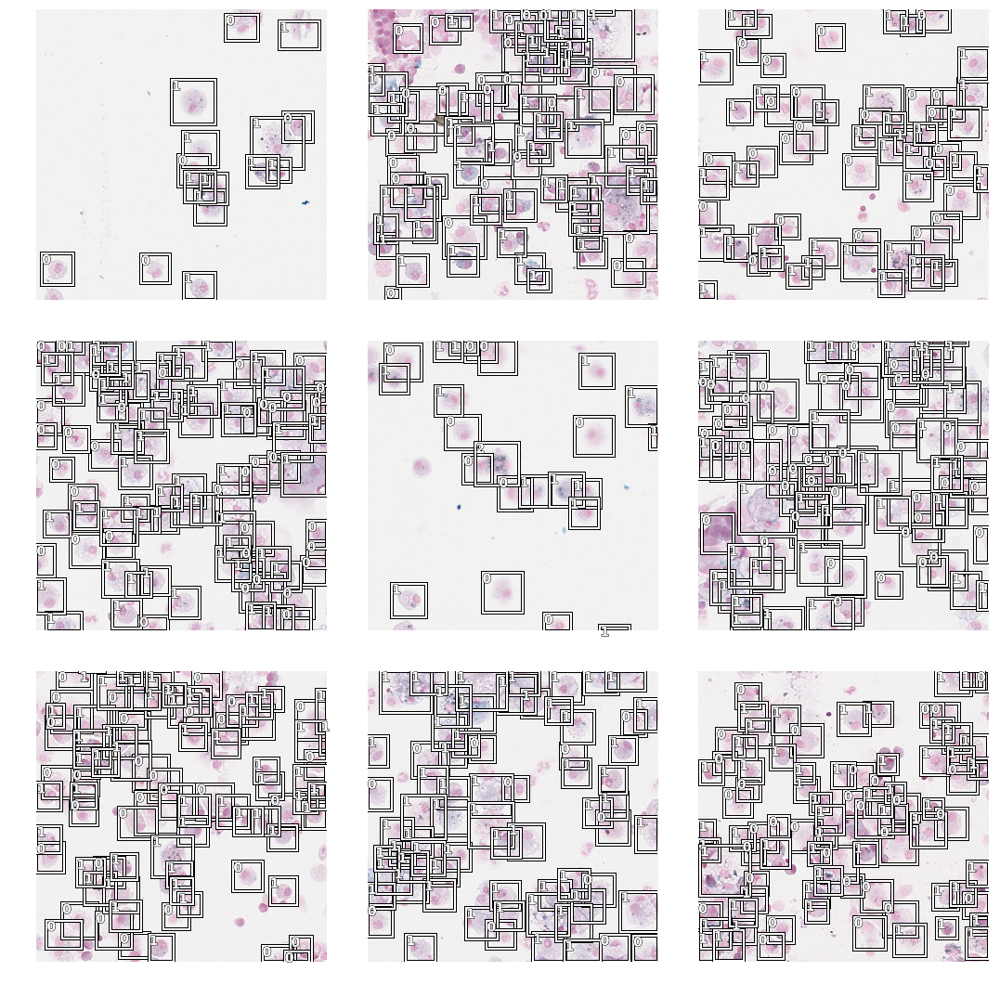

In [14]:
data.show_batch(rows=3, ds_type=DatasetType.Train, figsize=(15,15))

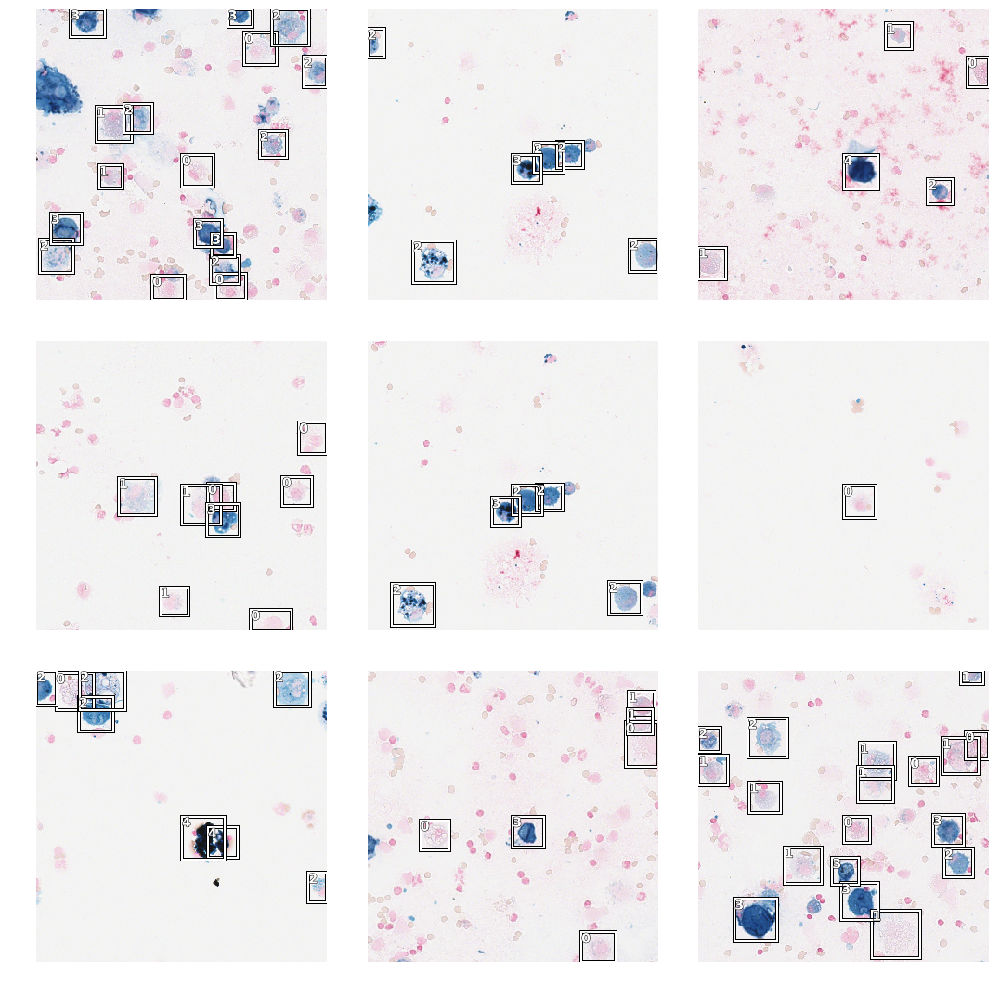

In [15]:
data.show_batch(rows=3, ds_type=DatasetType.Valid, figsize=(15,15))

In [16]:
anchors = create_anchors(sizes=[(32,32)], ratios=[1], scales=[0.6, 0.7, 0.9, 1.25, 1.5])

In [17]:
crit = RetinaNetFocalLoss(anchors)
encoder = create_body(models.resnet18, True, -2)
model = RetinaNet(encoder, n_classes=data.train_ds.c, n_anchors=5, sizes=[32], chs=128, final_bias=-4., n_conv=3)

In [18]:
voc = PascalVOCMetricByDistance(anchors, size, [str(i) for i in data.train_ds.y.classes[1:]], radius=40)
learn = Learner(data, model, loss_func=crit, callback_fns=[BBMetrics, partial(CSVLogger, append=True, filename=experiment_name)], #BBMetrics, ShowGraph
                metrics=[voc]
               )

In [19]:
learn.split([model.encoder[6], model.c5top5])
learn.freeze_to(-2)

In [20]:
learn.fit_one_cycle(3, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,AP-2,AP-3,AP-4,time
0,0.386009,0.929901,0.344887,0.096551,0.833350,0.363643,0.606715,0.252436,0.127412,0.374229,17:48
1,0.190599,0.540980,0.400312,0.090680,0.450300,0.648401,0.532949,0.142556,0.296270,0.381383,17:16
2,0.147286,0.446104,0.478782,0.074137,0.371967,0.620003,0.576629,0.326515,0.411238,0.459523,17:21


In [21]:
learn.unfreeze()
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,AP-2,AP-3,AP-4,time
0,0.137316,0.511018,0.436592,0.079302,0.431716,0.632726,0.634805,0.290226,0.306339,0.318863,17:36
1,0.170373,0.492754,0.493240,0.087211,0.405543,0.451981,0.695933,0.600102,0.248170,0.470013,17:41
2,0.183112,0.595499,0.341192,0.082061,0.513437,0.485632,0.607436,0.212785,0.367963,0.032143,17:50
3,0.145477,0.525053,0.370890,0.082467,0.442586,0.531742,0.631668,0.319101,0.150591,0.221351,17:39
4,0.134871,0.472726,0.406993,0.078972,0.393754,0.548099,0.695088,0.220506,0.410776,0.160494,17:39
5,0.133507,0.609212,0.422760,0.084617,0.524595,0.444637,0.652746,0.221211,0.402288,0.392918,17:51
6,0.115317,0.494432,0.451529,0.074162,0.420270,0.545057,0.717180,0.285269,0.483716,0.226426,17:38
7,0.101023,0.467710,0.506712,0.060709,0.407001,0.647475,0.696473,0.392984,0.521585,0.275044,17:29
8,0.099164,0.484352,0.484269,0.062646,0.421706,0.607398,0.706093,0.382637,0.465852,0.259365,17:38
9,0.093967,0.475909,0.490447,0.061772,0.414137,0.601261,0.705288,0.397597,0.459767,0.288324,17:35


In [22]:
learn.fit_one_cycle(10, 1e-3)

epoch,train_loss,valid_loss,pascal_voc_metric_by_distance,BBloss,focal_loss,AP-0,AP-1,AP-2,AP-3,AP-4,time
0,0.097983,1.121594,0.305343,0.067324,1.054270,0.570857,0.661203,0.288892,0.005762,0.000000,17:37
1,0.122126,0.591786,0.451588,0.089182,0.502604,0.606620,0.634754,0.366113,0.421721,0.228731,17:41
2,0.131851,0.535689,0.436952,0.072674,0.463015,0.668001,0.585186,0.245317,0.442036,0.244218,17:41
3,0.122294,0.563075,0.435298,0.071412,0.491664,0.647000,0.741601,0.469755,0.135424,0.182711,17:44
4,0.116098,0.482375,0.445177,0.068005,0.414371,0.580160,0.710739,0.372079,0.413968,0.148937,17:28
5,0.110330,0.562416,0.461107,0.069390,0.493026,0.617121,0.660326,0.350435,0.378141,0.299510,17:35
6,0.102368,0.588901,0.491529,0.068915,0.519986,0.639300,0.689567,0.378552,0.446567,0.303657,17:38
7,0.092043,0.567211,0.486818,0.064523,0.502688,0.576905,0.712149,0.497218,0.432715,0.215104,17:36
8,0.085060,0.598433,0.467310,0.060722,0.537711,0.588493,0.689794,0.465631,0.444599,0.148032,17:40
9,0.082584,0.573457,0.468381,0.060584,0.512873,0.568727,0.692794,0.502460,0.417182,0.160740,17:36


In [23]:
import pickle

stats = {"anchors": anchors,
         "mean": to_np(data.stats[0]),
         "std": to_np(data.stats[1]),
         "size": size,
         "n_classes": 6,
         "n_anchors": 5,
         "sizes": [32],
         "chs": 128,
         "encoder": "RN-18",
         "n_conv": 3,
         "level": 0,
         "model": get_model(learn.model).state_dict()
        }

torch.save(stats, "{}.p".format(experiment_name))

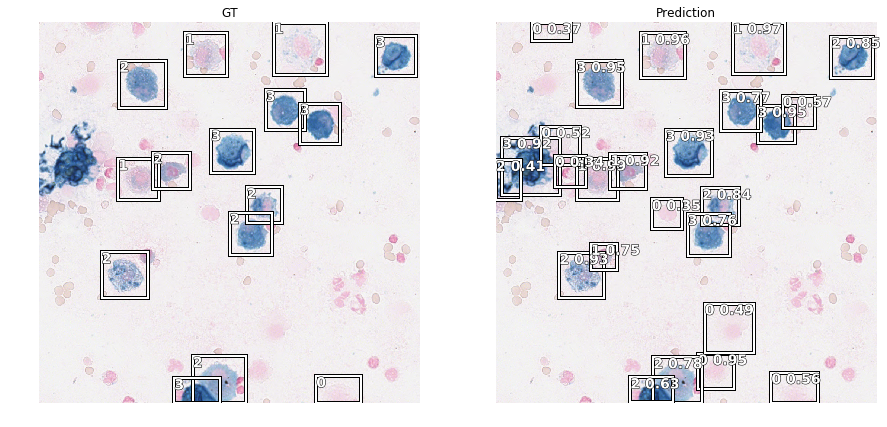

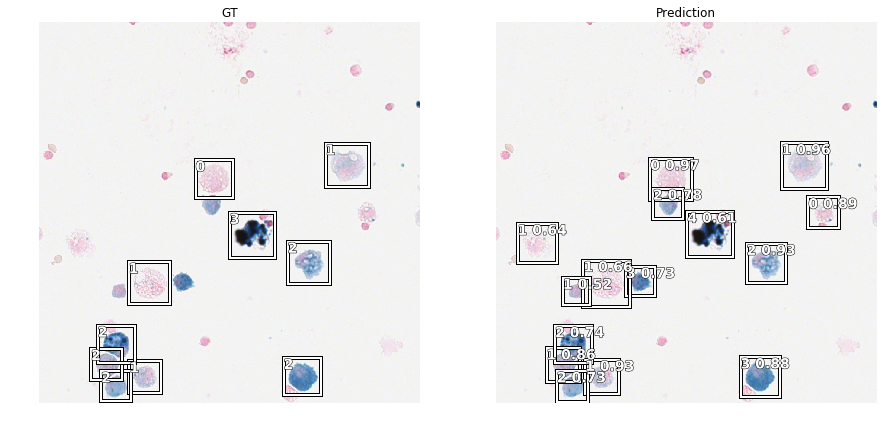

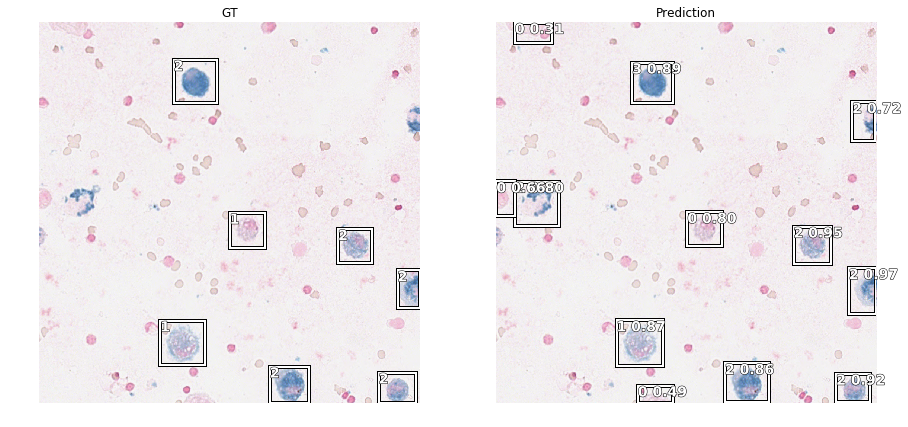

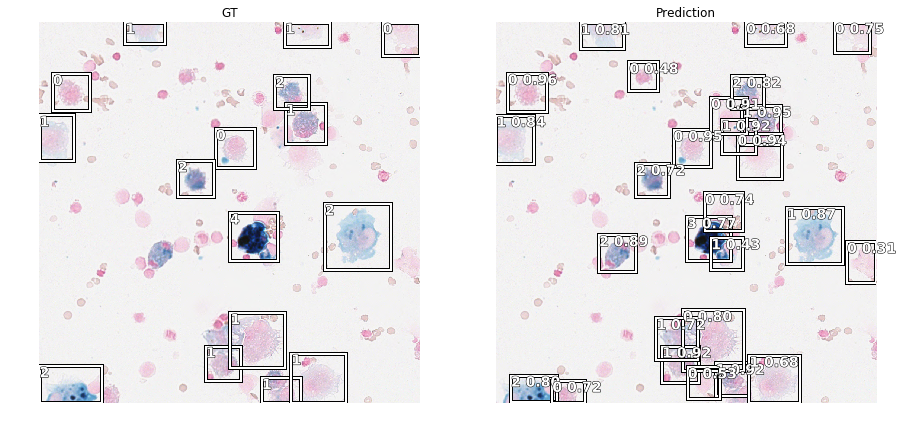

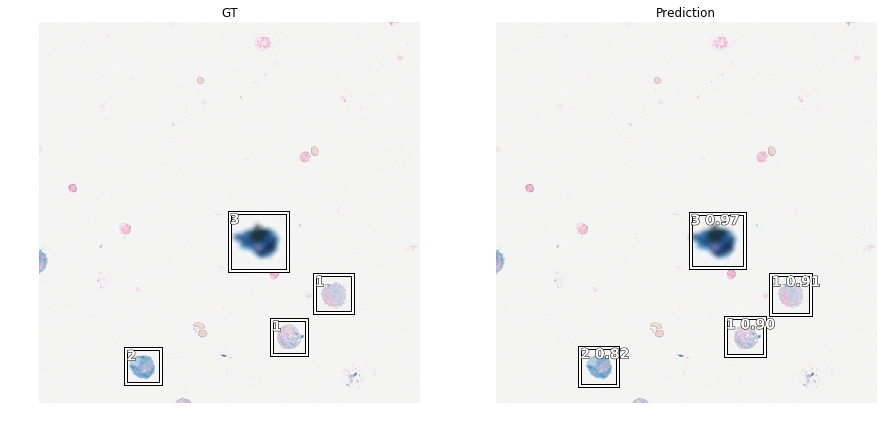

...

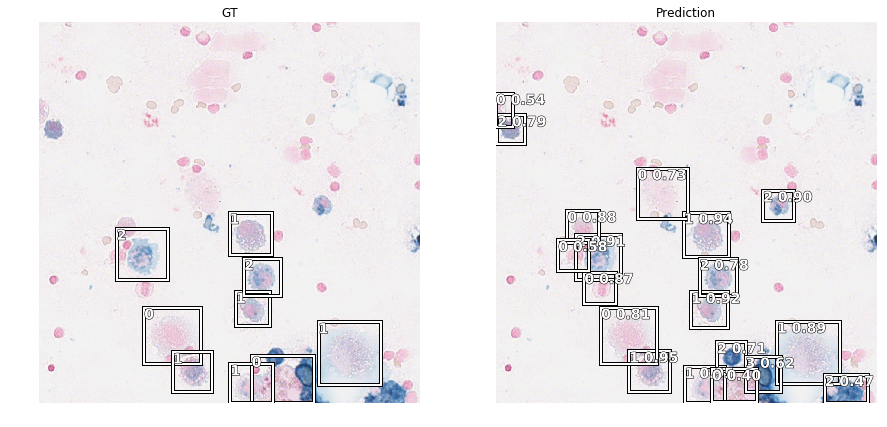

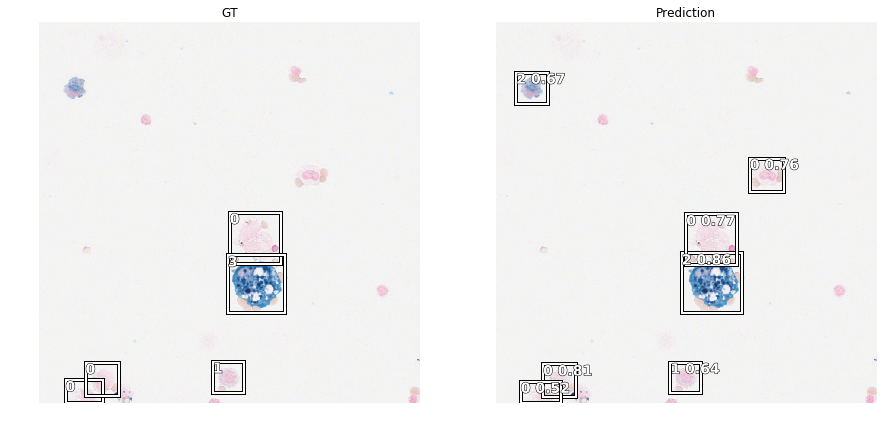

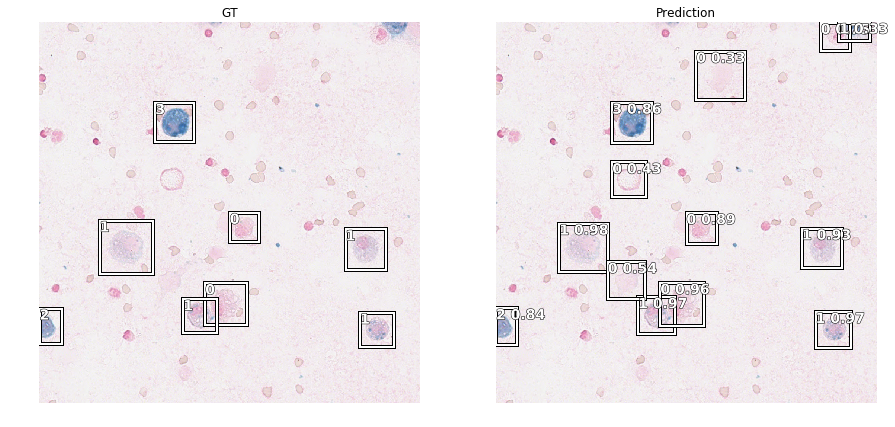

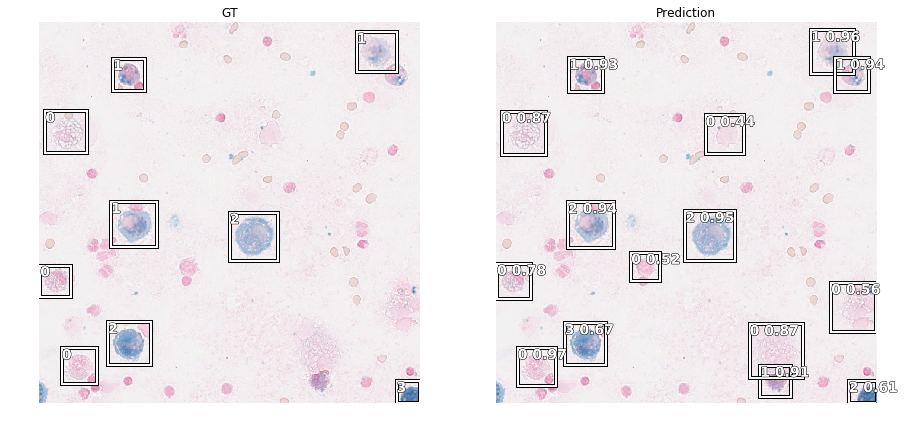

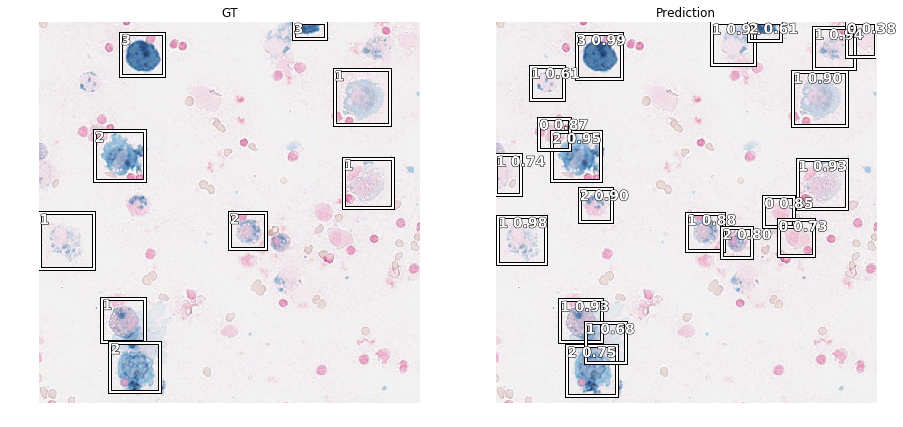

In [24]:
slide_object_result(learn, anchors, detect_thresh=0.3, nms_thresh=0.2, image_count=20)